# Visualiser des images

## Du pixel aux images - 32M7138

*Printemps 2024 - Université de Genève*

*Adrien Jeanrenaud (adrien.jeanrenaud@unige.ch)*

<div class="alert alert-block alert-info">
<b>Visualiser des images</b> : 
    <br>Après avoir traité nos images et en avoir extrait des informations, il est nécessaire de rendre les résultats visibles. Python permet de visualiser les images en quantité ainsi que leurs métadonnées.
</div>

## **Plan du cours**

> **Visualiser simplement**
> * Visualiser grâce à une boucle
> * Les images sur un graphique
> * Visualiser l'image et ses informations
> * Enregistrer ses visualisation 

> **Construire sa visualisation**
> * Une mosïque d'images redimensionnées
> * Concaténation verticale
> * Concaténation horizontale
> * Une fonction pour faire des mosaïques ?

> **Plus loin dans la visualisation**
> * PixPlot
> * IVPY

In [1]:
# importer les librairies nécessaires

import numpy as np
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt

## 1. Visualiser simplement

Matplotlib permet de visualiser les images en enfilade. La librairie permet également de créer des graphiques auxquels il est possible d'ajouter des informations à l'image.

### Visualiser grâce à boucle

Variante de visualisation en boucle

In [2]:
# importer un dossier d'images
def importer_images(path):
    
    liste_images = []
    ext = [".jpeg", ".png", ".jpg"]
    dossier = os.listdir(path)
    for files in dossier:
        if files.endswith(tuple(ext)):
            image_dossier = os.path.join(path, files)
            image = cv2.imread(image_dossier)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            liste_images.append(image)
    return liste_images

In [3]:
# dans quel dossier nous sommes

os.getcwd()

'/Users/adrien/Documents/Documents/UniGE/cours/cours_images_2024'

In [4]:
# fichiers et dossiers où nous sommes

os.listdir(".")

['cours1_2024.pdf',
 'cours_analyseTexte_2024.pptx',
 'name_2727921280430073225_1966-01-01.jpg',
 'VanGogh_portrait_annee.csv',
 '.DS_Store',
 'explore.csv',
 'CHAMPENOIS Robin - Introduction à la vision par ordinateur.pdf',
 'crash-magazine-01.pdf',
 'explore_dates.csv',
 'cours1_2024.pptx',
 'images',
 'cours7_manipulationsImages_part1.ipynb',
 '38-vangogh.csv',
 'image_name.jpg',
 'cours6_manipulations_part2.ipynb',
 'cours2_scraping.ipynb',
 'VanGogh_portrait.csv',
 'explore_less.csv',
 'VanGogh_portrait_pays.csv',
 'VanGogh_portrait.zip',
 'image_1_.jpg',
 'unige_face1.jpg',
 'extensions.svg',
 'unige.jpg',
 'cours4-machine_image.ipynb',
 'affiches',
 'haarcascade_frontalface_alt.xml',
 'unige_face3.jpg',
 'unige_face2.jpg',
 'cours5_manipulations_part1.ipynb',
 'cours9_visualisations.ipynb',
 'unige_face6.jpg',
 'unige_face7.jpg',
 'imagesVanGogh',
 'noise.jpg',
 'cours2_2024.pdf',
 'VanGogh_portrait',
 'unige_face5.jpg',
 'unige_face4.jpg',
 'explore_coutry.csv',
 'image_visage

In [5]:
# Utilisons la fonction

mes_images = importer_images(path="VanGogh_portrait")

In [6]:
# Ma liste d'images

len(mes_images)

41

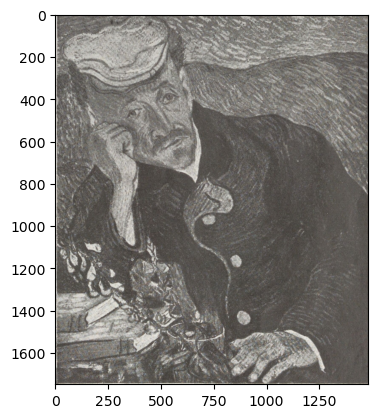

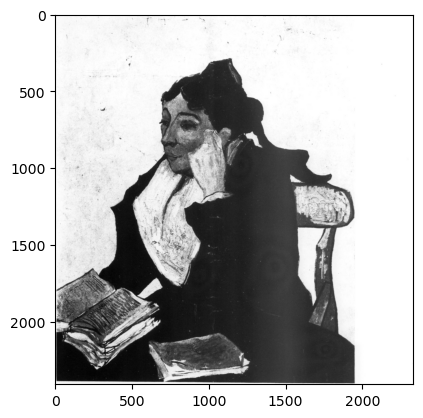

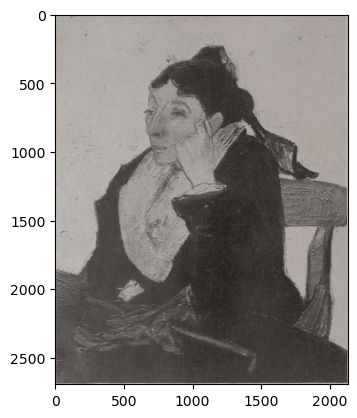

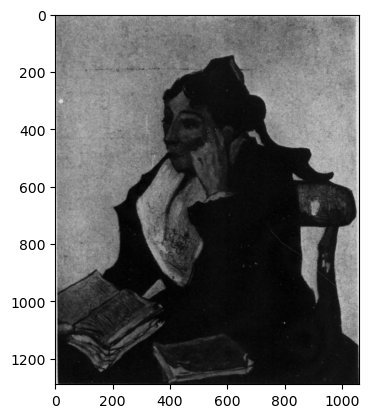

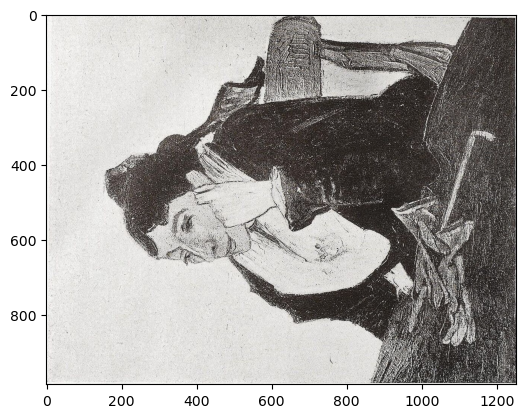

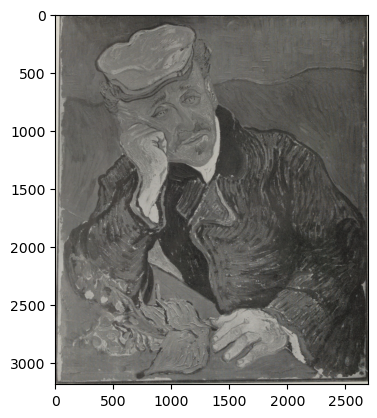

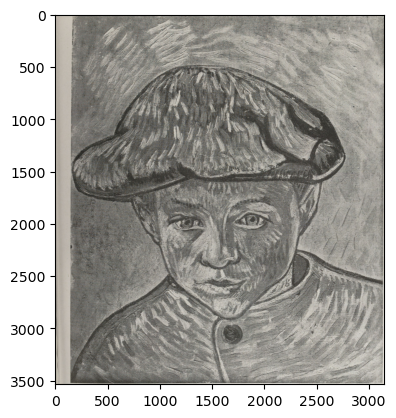

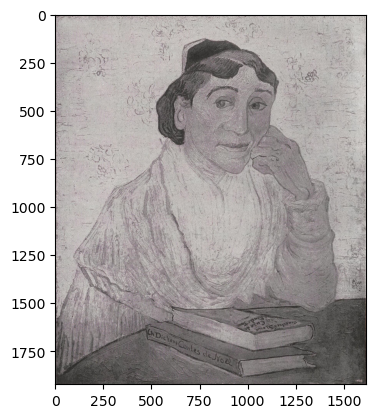

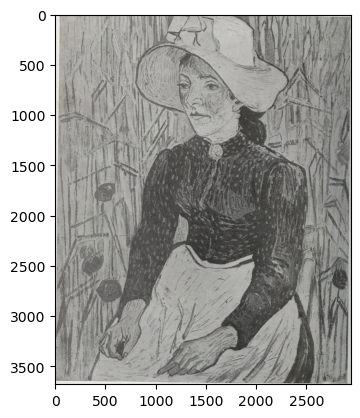

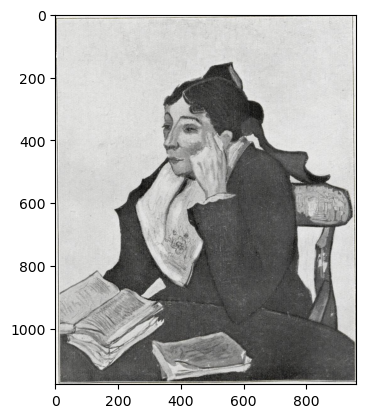

In [7]:
# Visualiser les 10 première

for i in mes_images[:10]:
    plt.imshow(i)
    plt.show()

### Les images sur un graphique

Cette librairie permet principalement de faire des graphiques. C'est une manière de visualiser les images

Text(0.5, 1.0, 'Image 2')

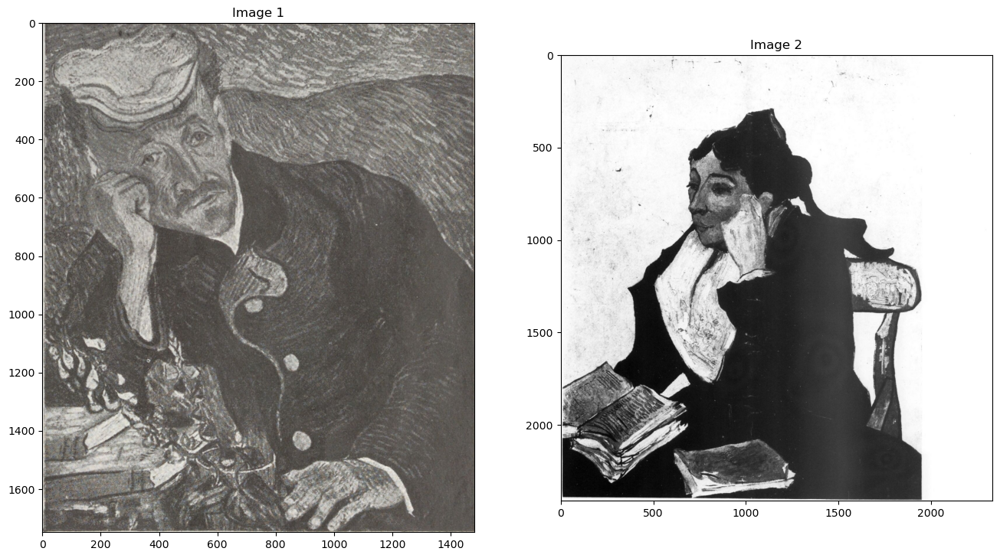

In [8]:
# visualiser deux images face à face

fig, ax = plt.subplots(1,2, figsize=(16,12)) # Cette ligne crée une figure (fig) et deux sous-tracés (ax) disposés côte à côte. 
                                            # Le paramètre 1,2 spécifie qu'il y aura 1 ligne et 2 colonnes de sous-tracés, donc deux sous-tracés au total. 
                                            # Le paramètre figsize=(16,12) définit la taille de la figure à 16 pouces de largeur sur 12 pouces de hauteur.
ax[0].imshow(mes_images[0])
ax[0].set_title('Image 1')
ax[1].imshow(mes_images[1])
ax[1].set_title('Image 2')

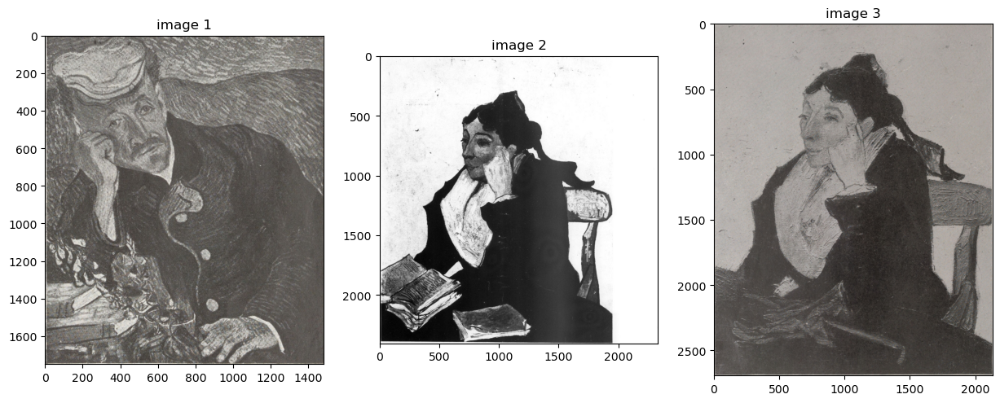

In [9]:
# visualiser 3 images

plt.figure(figsize=(15,10))
plt.subplot(131); plt.imshow(mes_images[0]); plt.title("image 1") # Cette ligne crée un sous-tracé dans une grille de 1 ligne par 3 colonnes et sélectionne le premier sous-tracé. 
                                                                    # Ensuite, il affiche la première image (mes_images[0]) sur ce sous-tracé et lui attribue le titre "image 1" avec plt.title().
plt.subplot(132); plt.imshow(mes_images[1]); plt.title("image 2")
plt.subplot(133); plt.imshow(mes_images[2]); plt.title("image 3")
plt.show()

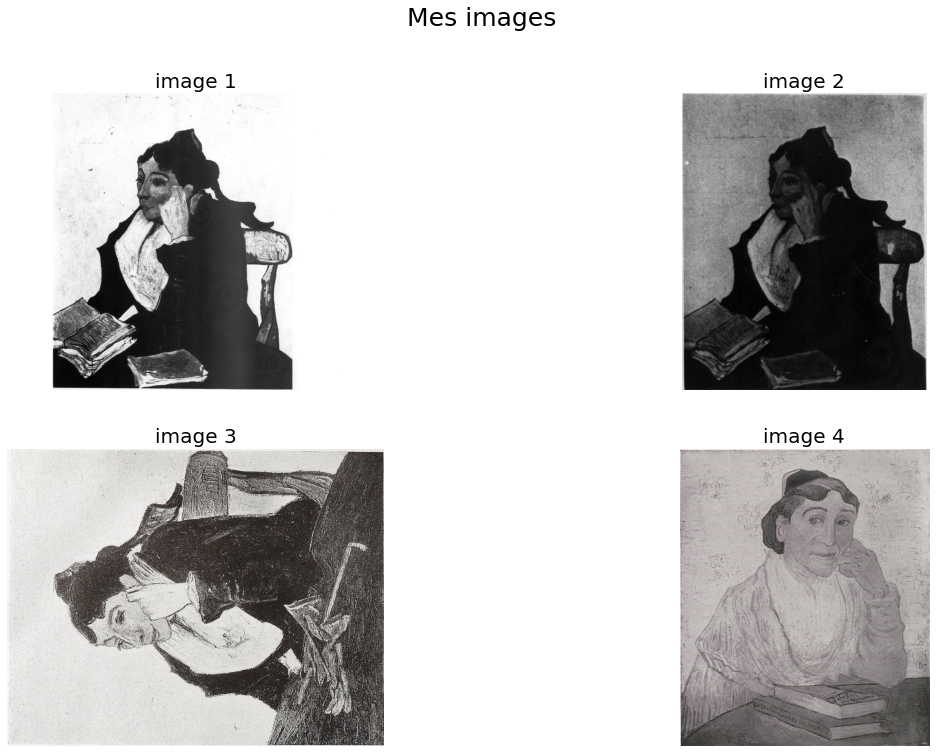

In [10]:
# visualiser 4 images

plt.figure(figsize=(20,12))
plt.subplot(221), plt.imshow(mes_images[0]), plt.axis('off'), plt.title('image 1', size=20) # Cette ligne crée le premier sous-tracé dans une grille de 2 lignes par 2 colonnes et le sélectionne. 
                                                                                            # Ensuite, elle affiche la première image (mes_images[0]) sur ce sous-tracé, 
                                                                                            # désactive les axes avec plt.axis('off'), et attribue le titre "image 1" avec une taille de police de 20 points.
plt.subplot(222), plt.imshow(mes_images[1]), plt.axis('off'), plt.title('image 2', size=20)
plt.subplot(223), plt.imshow(mes_images[2]), plt.axis('off'), plt.title('image 3', size=20)
plt.subplot(224), plt.imshow(mes_images[3]), plt.axis('off'), plt.title('image 4', size=20)
plt.suptitle('Mes images', size=25)
plt.show()

### Visualiser l'image et ses informations

La méthode précdente n'est pas très automatisé, surtout au niveau des métadonnées.

In [10]:
# importer le csv

dff = pd.read_csv("explore_less.csv", index_col=[0])

In [11]:
dff.head()

,numero_cluster,manifest_url,canvas_number,image_url,City,Country,Title,wkt,Date,Journal Type,notice,group_name,group_tags,Filename
0,258,https://gallica.bnf.fr/iiif/ark:/12148/bpt6k42...,389.0,https://gallica.bnf.fr/iiif/ark:/12148/bpt6k42...,Paris,France,L'Amour de l'art (1920),POINT(2.3513888888889 48.856944444444),1924-02-01,Modern Art Journal,NaN,VanGogh_ItalianWoman_1887,Portrait,8861007808267359747_1924-02-01.jpg
1,135,https://digi.ub.uni-heidelberg.de/diglit/iiif/...,262.0,https://digi.ub.uni-heidelberg.de/iiif/2/rhs19...,Warsaw,Poland,Rocznik Historii Sztuki,POINT(21.011111111111113 52.23),1966-01-01,Art History,NaN,VanGogh_Arlesienne_1888,Portrait,2727921280430073225_1966-01-01.jpg
2,135,https://digi.ub.uni-heidelberg.de/diglit/iiif/...,305.0,https://digi.ub.uni-heidelberg.de/iiif/2/dkd19...,Stuttgart,Germany,Deutsche Kunst und Dekoration,POINT(9.1775 48.776111111111),1912-01-01,Decorative Art,NaN,VanGogh_Arlesienne_1888,Portrait,12723693742842148905_1912-01-01.jpg
3,135,https://digi.ub.uni-heidelberg.de/diglit/iiif/...,338.0,https://digi.ub.uni-heidelberg.de/iiif/2/dkd19...,Stuttgart,Germany,Deutsche Kunst und Dekoration,POINT(9.1775 48.776111111111),1921-01-01,Decorative Art,NaN,VanGogh_Arlesienne_1888,Portrait,5605650274174973682_1921-01-01.jpg
4,135,https://digi.ub.uni-heidelberg.de/diglit/iiif/...,501.0,https://digi.ub.uni-heidelberg.de/iiif/2/kunst...,Berlin,Germany,Der Kunstwanderer,POINT(13.383333333333 52.516666666667),1927-01-01,Art Journal,NaN,VanGogh_Arlesienne_1888,Portrait,8854971534209556026_1927-01-01.jpg


In [12]:
dff.Filename.iloc[0]

'8861007808267359747_1924-02-01.jpg'

In [13]:
dname = "VanGogh_portrait"

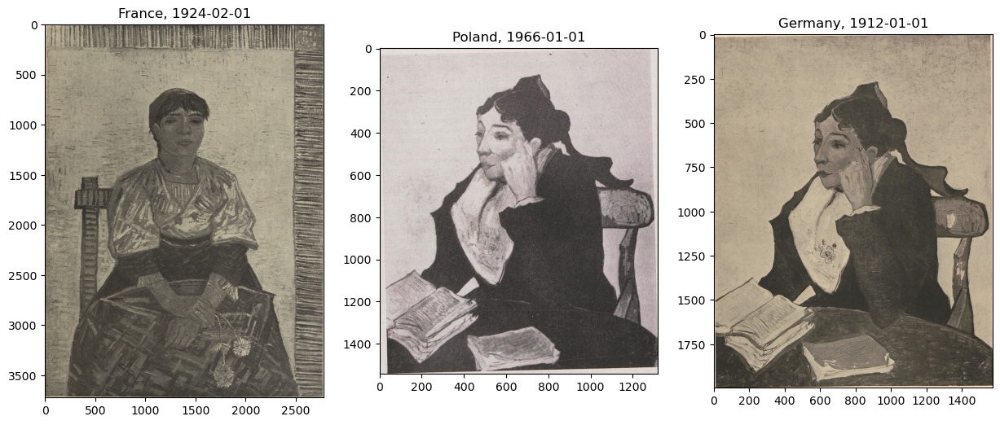

In [14]:
# visualiser mes 3 images

plt.figure(figsize=(15,10))
# 1 ligne, 3 colones
plt.subplot(131); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[0])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[0]}, {dff.Date.iloc[0]}");
plt.subplot(132); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[1])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[1]}, {dff.Date.iloc[1]}")
plt.subplot(133); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[2])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[2]}, {dff.Date.iloc[2]}")
plt.show()

In [24]:
# Visualiser une image avec du texte

from PIL import Image
from PIL import ImageDraw, ImageFont

img = Image.open(os.path.join(dname, dff.Filename.iloc[0]))

txt = ImageDraw.Draw(img)

# Définir la taille et la police du texte
font_size = 100
font = ImageFont.load_default(font_size)  # Utiliser la police par défaut

txt.text((28, 36), f"{dff.City.iloc[0]}, {dff.Country.iloc[0]}, {dff.Date.iloc[0]}", fill=(255, 255, 255), font=font)

img.show()


### Enregistrer ses visualisation 

In [25]:
# Visualiser une image avec du texte et enregistrer

from PIL import Image
from PIL import ImageDraw

img = Image.open(os.path.join(dname, dff.Filename.iloc[0]))

txt = ImageDraw.Draw(img)

font_size = 100
font = ImageFont.load_default(font_size)  # Utiliser la police par défaut

txt.text((28, 36), f"{dff.City.iloc[0]}, {dff.Country.iloc[0]}, {dff.Date.iloc[0]}", fill=(255, 255, 255), font=font)

img.show()

img.save(f"name_{dff.Filename.iloc[0]}", dpi=(300,300))

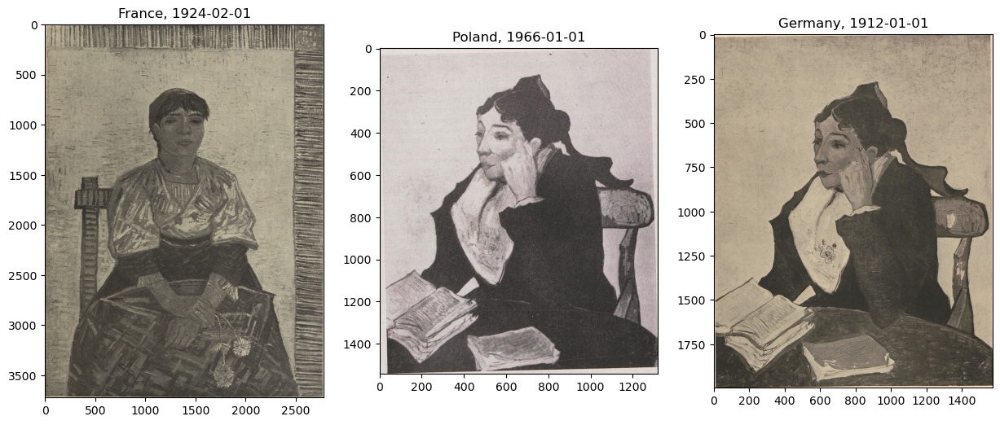

Text(0.5, 0.98, 'VanGogh_portrait')

<Figure size 640x480 with 0 Axes>

In [26]:
# visualiser mes 3 images et enregistrer

plt.figure(figsize=(15,10))
plt.subplot(131); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[0])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[0]}, {dff.Date.iloc[0]}");
plt.subplot(132); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[1])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[1]}, {dff.Date.iloc[1]}")
plt.subplot(133); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[2])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Country.iloc[2]}, {dff.Date.iloc[2]}")
plt.show()
plt.suptitle('VanGogh_portrait', size=25)
#plt.savefig(f"name2_{dff.Filename.iloc[0]}", dpi=300)

## 2. Construire sa visualisation
### Une mosaïque d'images redimensionnées

Pour pouvoir faire une mosaïque d'images, il faut au préalable les redimensionner en gardant les proportions: un petit rappel sur la manière pour le faire.

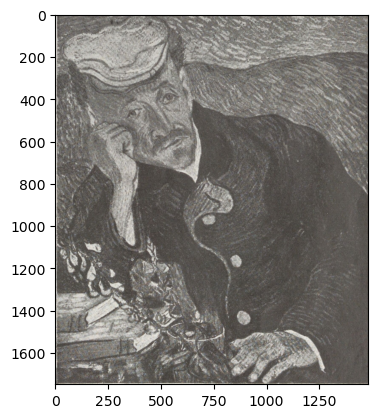

In [27]:
# reprenons notre images

plt.imshow(mes_images[0])
plt.show()

(500, 423, 3) (1749, 1482, 3)


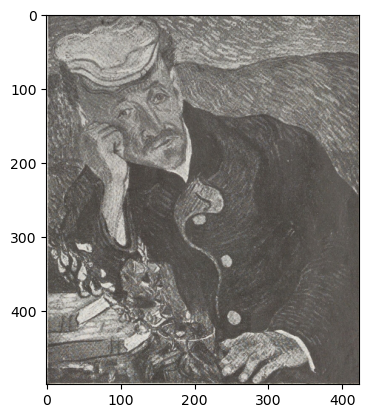

In [29]:
# Redimensionner en gardant les proportion

# Récupérer les dimensions de l'image originale
(h, w) = mes_images[0].shape[:2]

# Définir la nouvelle hauteur souhaitée
newh = 500

# Calculer le ratio de redimensionnement basé sur la nouvelle hauteur
ratio = newh / float(h)

# Calculer les nouvelles dimensions en conservant les proportions
newdim = (int(w * ratio), newh)

# Redimensionner l'image en utilisant les nouvelles dimensions
redim = cv2.resize(mes_images[0], newdim)

# Afficher les dimensions de l'image originale et de l'image redimensionnée
print(redim.shape, mes_images[0].shape)

# Afficher l'image redimensionnée
plt.imshow(redim)
plt.show()


(2408, 2040, 3) (1749, 1482, 3) (2408, 2333, 3)


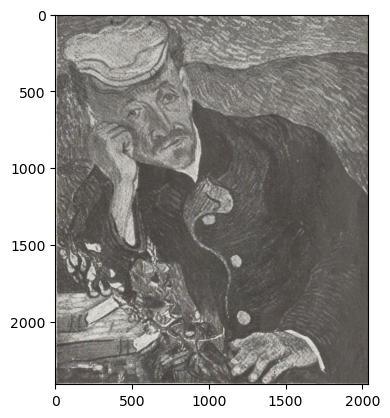

In [30]:
# Redimensionner une image avec une autre en gardant les proportion 

(h, w) = mes_images[0].shape[:2]
newh = mes_images[1].shape[0]
ratio = newh/ float(h)
newdim = (int(w * ratio), newh)
redim = cv2.resize(mes_images[0], newdim)
print(redim.shape, mes_images[0].shape, mes_images[1].shape)
plt.imshow(redim)
plt.show()

### Concaténation horizontale

Redimensionner les images selon leur hauteur permet de les concaténer horizontalement

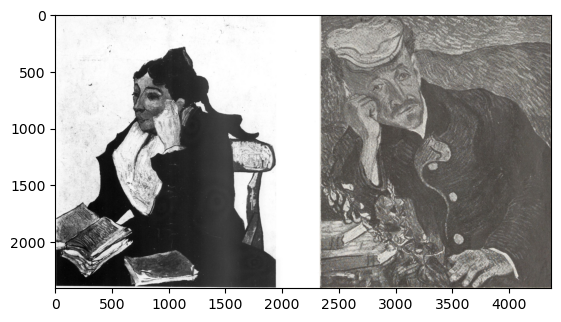

In [31]:
concat_h = cv2.hconcat([mes_images[1], redim])
plt.imshow(concat_h)
plt.show()

### Concaténation verticale

Redimensionner les images selon leur largeur permet de les concaténer verticalement

In [32]:
# avec deux images de dimensions différentes

print(mes_images[1].shape, mes_images[2].shape)

(2408, 2333, 3) (2693, 2132, 3)


In [33]:
w = mes_images[1].shape[1]
ratio = w/float(mes_images[2].shape[1])
newdim = (w, int(mes_images[2].shape[0]*ratio))
newdim

(2333, 2946)

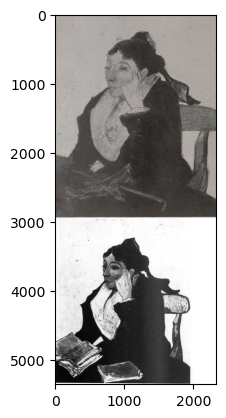

In [34]:
# Opérer la changement de dimension puis concatener

redim2 = cv2.resize(mes_images[2], newdim)
conc_h = cv2.vconcat([redim2, mes_images[1]])
plt.imshow(conc_h)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

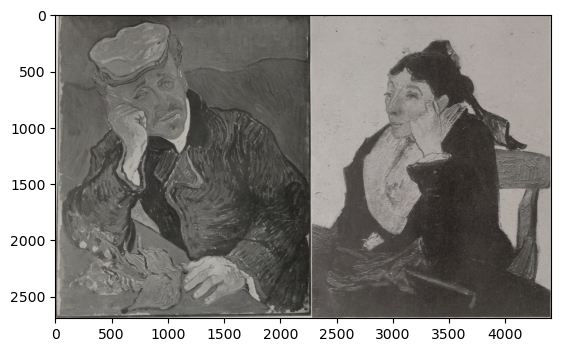

In [35]:
# si on met tout dans une cellule ?

img1 = mes_images[2]
img2 = mes_images[5]
filename = "concat.jpg"
h = img1.shape[0]
ratio = h/float(img2.shape[0])
newdim = (int(img2.shape[1]*ratio), h)
redim2 = cv2.resize(img2, newdim)
conc_h = cv2.hconcat([redim2, img1])
conc_hc = cv2.cvtColor(conc_h, cv2.COLOR_RGB2BGR)
#cv2.imwrite(filename, conc_hc)
plt.imshow(conc_h)
plt.show

### Faites votre mosaïque

<div class="alert alert-block alert-warning">
<b>Exercice</b>: 
   <br>Il s'agit de créer une mosaïque verticale et horizontale. Par mosaïque j'entends une concaténation d'images pour former un rectangle d'images. Au terme, vous aurez une fonction qui prend comme arguments le nombre d'images par ligne, le CSV et le nom d'un Citye. Il est possible que vous deviez compléter une ligne avec un forme à créer. L'image doit être enregistrée à la fin.</div>

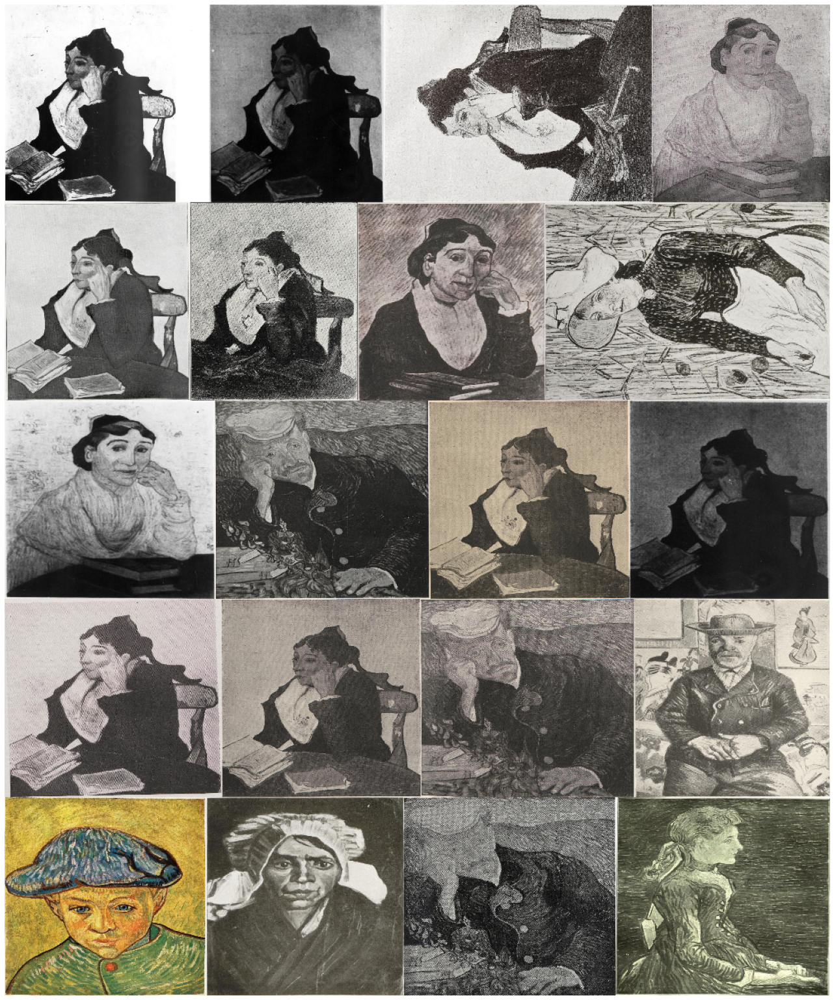

In [25]:
path="VanGogh_portrait"
n = 8
n_img = 40
newh = 600
neww = 1000
    
ext = [".png", ".jpg", ".jpeg"] #extensions
img_list = [] #liste vide pour les images
files = os.listdir(path) #une liste avec les fichiers dans un dossier


for img in files: # pour chaque fichier
    if img.endswith(tuple(ext)): # si le fichier termine par mon extension
        image_path = os.path.join(path, img) # tabulation après la fonction
        image = cv2.imread(image_path) # lire l'image
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        (h, w) = image.shape[:2]
        ratio = newh/ float(h)
        newdim = (int(w * ratio), newh)
        redim = cv2.resize(image, newdim)
        
        img_list.append(redim) # sauvegarder les images dans un dossier
        img_list = img_list[:n_img]
        ...

## 3. Plus loin dans la visualisation

### PixPlot

Pour la visualisation d'images en grande quantité: https://github.com/YaleDHLab/pix-plot 

### IVPY

Pour la visualisation d'images et de leurs informations: https://github.com/damoncrockett/ivpy